In [11]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/csavala4/DSP/tree/master/code/thinkdsp.py

# Solution Exercise 1.2:
    This solution will consist of approximately half-second segment where the pitch of the sound is constant. The spectrum of the segment will then be computed and plotted.
# Key Notes:
    Pitch: Relating to how high or low a sound is. Dependent on frequency of vibration.
    Timbre: Relating to sound quality. Allows the ear to distinguish sounds which have the same pitch and loudness.
    Apodization: Optical filtering technique. In our case, changes the shape of the signal by tapering the beginning and ending of the wave.

In [12]:
if not os.path.exists('511311__theojt__fantasy-classical-themes-2.wav'):
    !wget https://github.com/csavala4/DSP/tree/master/code/511311__theojt__fantasy-classical-themes-2.wav

In [30]:
from thinkdsp import read_wave

#Read .wav file
fantasy_wave = read_wave('511311__theojt__fantasy-classical-themes-2.wav')

#Normalize wave array to be, in this case, +1.0amp or -1.0amp
fantasy_wave.normalize()

fantasy_wave.make_audio()



The wave of the entire audio:

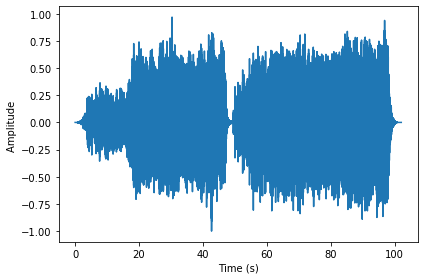

In [32]:
from thinkdsp import decorate
fantasy_wave.plot()
decorate(xlabel='Time (s)')
decorate(ylabel='Amplitude ')

The wave of a 0.4s segment:


In [33]:
#Segment the audio at start time and will last for the duration time in seconds.
fantasy_segment = fantasy_wave.segment(start = 7.0, duration = 0.4)

fantasy_segment.make_audio()


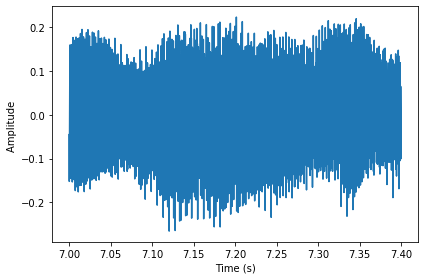

In [34]:
fantasy_segment.plot()
decorate(xlabel='Time (s)')
decorate(ylabel='Amplitude ')

The spectrum of the audio segment:

In [57]:
#Set var to compute segmented audio using fast Fourier Transform (FFT). Default to real FFT.
fantasy_spectrum = fantasy_segment.make_spectrum()

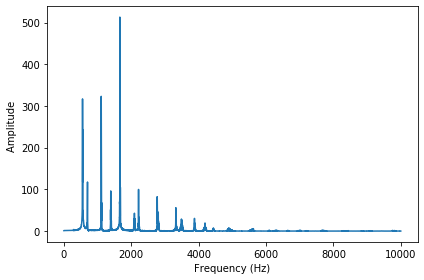

In [57]:
#Frequency in Hz
fantasy_spectrum.plot(high = 10000)
decorate(xlabel='Frequency (Hz)')
decorate(ylabel='Amplitude ')

At approximately 3500 Hz the frequency component grows smaller. Implementing a low-pass filter to attenuate the frequencies above 3500 Hz, or in this case, our cutoff frequency.

In [58]:
fantasy_spectrum.low_pass(3500)

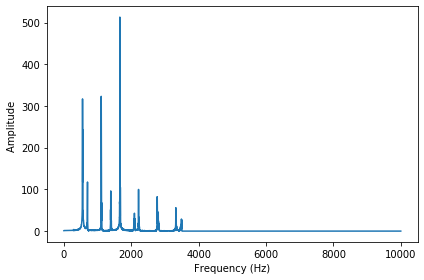

In [61]:
fantasy_spectrum.plot(high = 10000)
decorate(xlabel='Frequency (Hz)')
decorate(ylabel='Amplitude ')

In [76]:
#Spectrum transforms back into time domain and audio is output
filtered_segment = fantasy_spectrum.make_wave()

The plot below is the filtered segment:

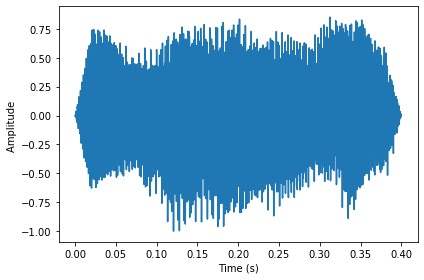

In [77]:
filtered_segment.normalize()
filtered_segment.apodize()
filtered_segment.plot()
decorate(xlabel='Time (s)')
decorate(ylabel='Amplitude ')

The plot below is the original segment:

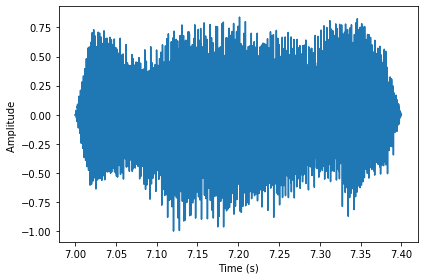

In [71]:
fantasy_segment.normalize()
fantasy_segment.apodize()
fantasy_segment.plot()
decorate(xlabel='Time (s)')
decorate(ylabel='Amplitude ')

In [79]:
#Output audio for the filtered segment
filtered_segment.make_audio()

In [80]:
#Output audio for the original segment
fantasy_segment.make_audio()